In [1]:
import pandas as pd  #for data manipulation operations
import numpy as np   #for linear algebra

#Libraries for visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

#Preprocessing features
from sklearn.preprocessing import LabelEncoder # for encoding
from sklearn.preprocessing import MinMaxScaler,StandardScaler #for standardization


from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, confusion_matrix, recall_score, f1_score,classification_report
from sklearn.metrics import roc_curve

from sklearn import model_selection
from scikitplot.metrics import plot_confusion_matrix, plot_roc

#ignore warnings
import warnings
warnings.filterwarnings("ignore")
# for connection with database
import psycopg2 as ps

In [2]:
connection = conn = ps.connect(
    host="localhost",
    database="ML_db",
    user="postgres",
    password="admin",port=5432)

In [ ]:
cursor = connection.cursor()
cursor.execute("DROP TABLE IF EXISTS red_wine")
cursor.execute("CREATE TABLE red_wine (fixed_acidity real , volatile_acidity real, critic_acid real, residual_sugar real, chlorides real, free_sulfur_dioxide real, total_sulfur_dioxide real, density real, pH real, sulphates real, alcohol real, quality int);")

connection.commit()

In [ ]:
connection.commit()

In [ ]:
cursor.execute("COPY red_wine FROM 'D:\\notes\\sem 2\\Machine Learning\\mini project\\winequality_red.csv' DELIMITER ',' CSV HEADER")

In [ ]:
cursor.execute("select*from red_wine;")
cursor.fetchall()

In [7]:
### importing and reading data
data = pd.read_csv("winequality-red.csv")
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [8]:
pd.unique(data['quality'])

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [10]:
data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [11]:
# Check for missing values
print(data.isnull().sum())

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


Identifying Categorical Features

In [12]:
unicol=[]
for col in data.columns:
    nuni=data[col].nunique()
    unicol.append(nuni)
unidata=pd.DataFrame(unicol,columns=['Unique Values'],index=data.columns) 
unidata

,Unique Values
fixed acidity,96
volatile acidity,143
citric acid,80
residual sugar,91
chlorides,153
free sulfur dioxide,60
total sulfur dioxide,144
density,436
pH,89
sulphates,96


Visualizations

In [13]:
fig=px.bar(data_frame=data,x=data.quality.value_counts().index,y=data.quality.value_counts(),color_discrete_sequence=['red'])
fig.update_layout(xaxis_title='Target',yaxis_title='No. of data points',title={
        'text': "Distribution of Wine Quality",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

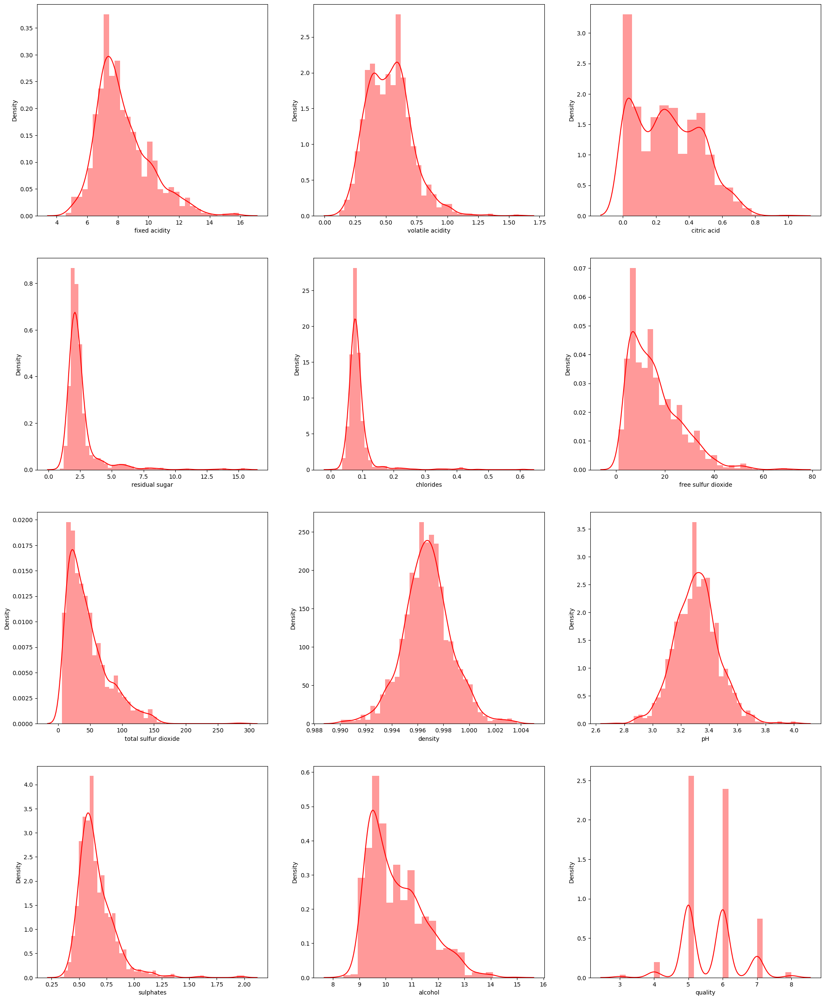

In [14]:
# checking for skewness
fig, ax = plt.subplots(4,3, figsize=(24,30))
k = 0
cols = list(data.columns)
for i in range(4):
    for j in range(3):
            sns.distplot(data[cols[k]], ax = ax[i][j], color = 'red')
            k += 1
plt.show()

Checking for Outliers

In [15]:

for col in data.columns[:-1]:
    fig =px.box(data, y=col, color="quality")
    fig.update_layout(height=500, width=1000,
                  title={
        'text': col.upper(),
        'y':0.98,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
    fig.show()

Optimizing Outliers

In [16]:
def mod_outlier(data):
        data1 = data.copy()
        data = data._get_numeric_data()
        q1 = data.quantile(0.25)
        q3 = data.quantile(0.75)

        iqr = q3 - q1

        lower_bound = q1 -(1.5 * iqr) 
        upper_bound = q3 +(1.5 * iqr)


        for col in data.columns:
            for i in range(0,len(data[col])):
                if data[col][i] < lower_bound[col]:            
                    data[col][i] = lower_bound[col]
                    
                if data[col][i] > upper_bound[col]:            
                    data[col][i] = upper_bound[col]
                    
        for col in data.columns:
            data1[col] = data[col]

        return data1
data= mod_outlier(data)

In [17]:
for col in data.columns[:-1]:
    fig = px.box(data, y=col, color="quality")
    fig.update_layout(height=500, width=1000,
                  title={
        'text': col.upper(),
        'y':0.98,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
    fig.show()

Identifying Correlations

<AxesSubplot:>

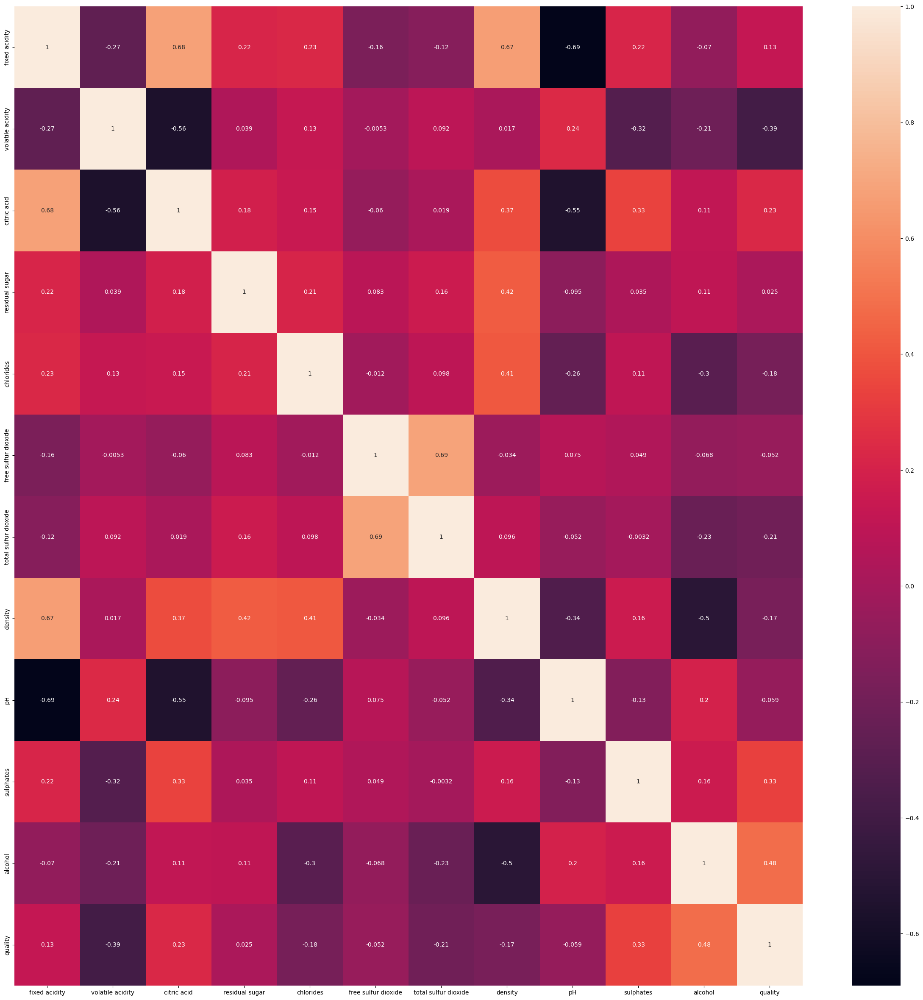

In [18]:
plt.figure(figsize = (30,30))
sns.heatmap(data.corr(),annot=True, cmap= 'rocket')

In [19]:
#Reducing the target label to only 2 labels: Bad Wine(0) & Good Wine(1)
data2=data.copy()
data2['quality'] = np.where(data2['quality'] >= 6, 1, 0)

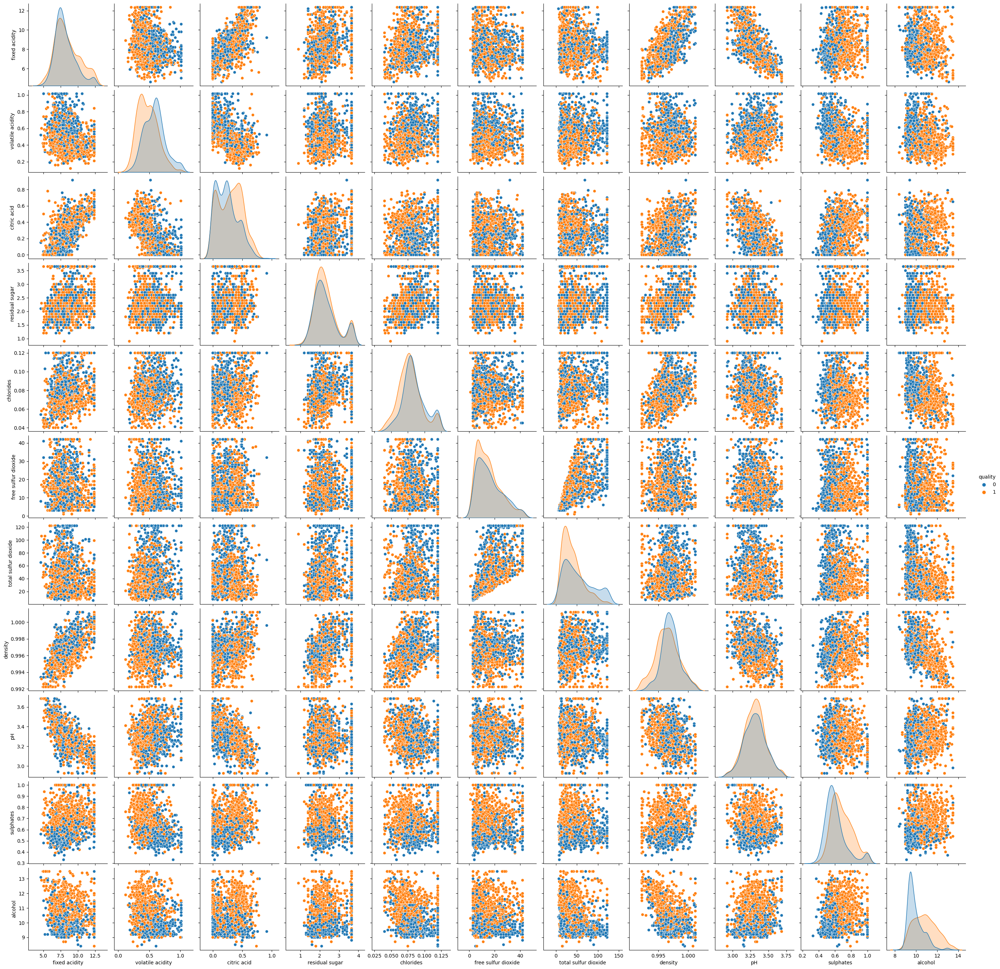

In [20]:
sns.pairplot(data2,hue='quality')

Highest Correlated Features with the Target label

Text(0, 0.5, 'Features')

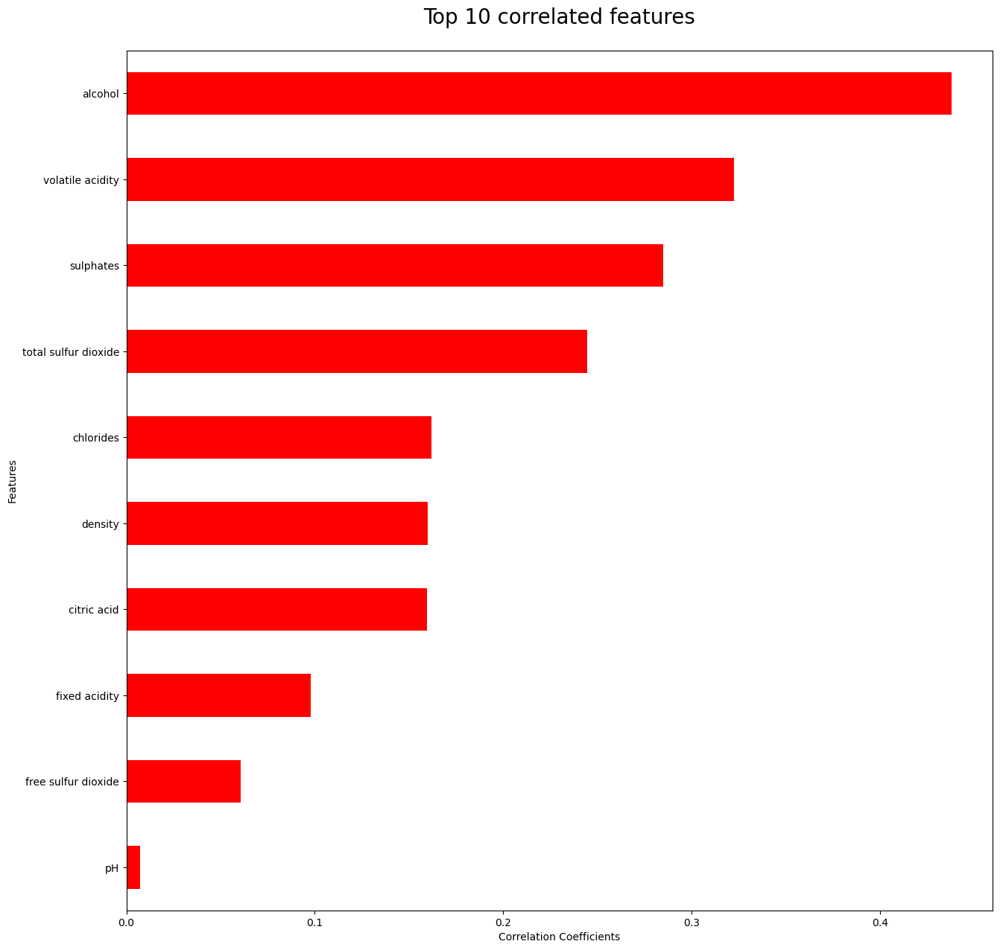

In [21]:
plt.figure(figsize=(15,15))
data2.corr()['quality'].apply(lambda x: abs(x)).sort_values(ascending=False).iloc[1:11][::-1].plot(kind='barh',color='red') 
plt.title("Top 10 correlated features", size=20, pad=26)
plt.xlabel("Correlation Coefficients")
plt.ylabel("Features")

In [22]:
features = ['fixed acidity', 'volatile acidity', 'citric acid', 'chlorides',
                     'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH',
                     'sulphates', 'alcohol','quality']

data=data[features]

In [23]:
# Splitting data into features(X) and targets(y)
X = data2.drop('quality', axis = 1).values
y = data2['quality'].values.reshape(-1,1)

In [24]:
from sklearn.model_selection import train_test_split

# Splitting the data into train and test sets to use in models
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size= 0.2, random_state= 42,stratify=y)

In [25]:
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

In [26]:
def train_model(model):
    model.fit(X_train_scaled,y_train)
    y_pred=model.predict(X_test_scaled)
    y_prob=model.predict_proba(X_test_scaled)
    accuracy=np.round((accuracy_score(y_test,y_pred))*100,2)
    precision=np.round((precision_score(y_test,y_pred,average='weighted'))*100,2)
    recall=np.round((recall_score(y_test,y_pred,average='weighted'))*100,2)
    
    print(f'Accuracy of the model: {accuracy}%')
    print(f'Precision Score of the model: {precision}%')
    print(f'Recall Score of the model: {recall}%')
    print('-'*50)
    print(classification_report(y_test,y_pred))
    
    fig, ax = plt.subplots(1, 2, figsize = (25,  8))
    ax1 = plot_confusion_matrix(y_test, y_pred, ax= ax[0], cmap= 'YlGnBu')
    ax2 = plot_roc(y_test, y_prob, ax= ax[1], plot_macro= False, plot_micro= False, cmap= 'summer')


Accuracy of the model: 75.94%
Precision Score of the model: 76.06%
Recall Score of the model: 75.94%
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.77      0.75       149
           1       0.79      0.75      0.77       171

    accuracy                           0.76       320
   macro avg       0.76      0.76      0.76       320
weighted avg       0.76      0.76      0.76       320



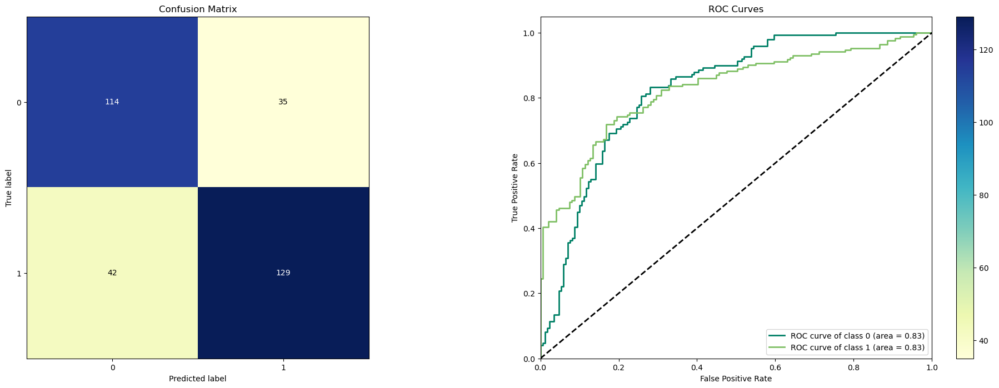

In [27]:
from sklearn.linear_model import LogisticRegression
logreg=LogisticRegression()
train_model(logreg)

Accuracy of the model: 71.88%
Precision Score of the model: 73.3%
Recall Score of the model: 71.88%
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.66      0.81      0.73       149
           1       0.80      0.64      0.71       171

    accuracy                           0.72       320
   macro avg       0.73      0.72      0.72       320
weighted avg       0.73      0.72      0.72       320



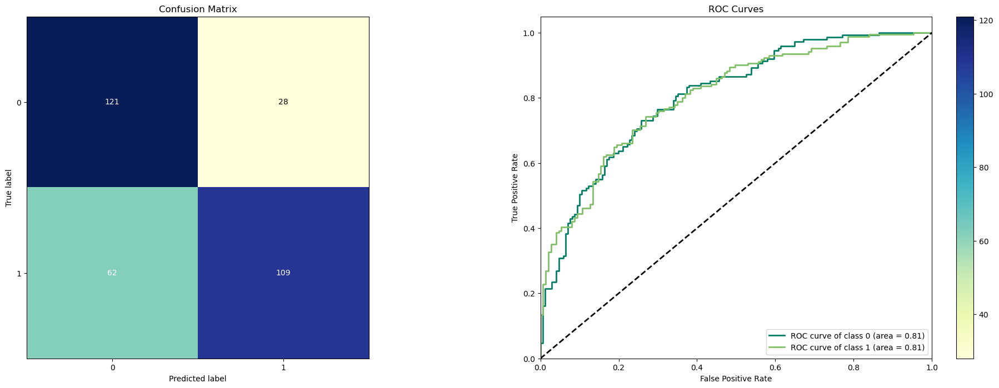

In [28]:
from sklearn.naive_bayes import GaussianNB

gnb=GaussianNB()
train_model(gnb)

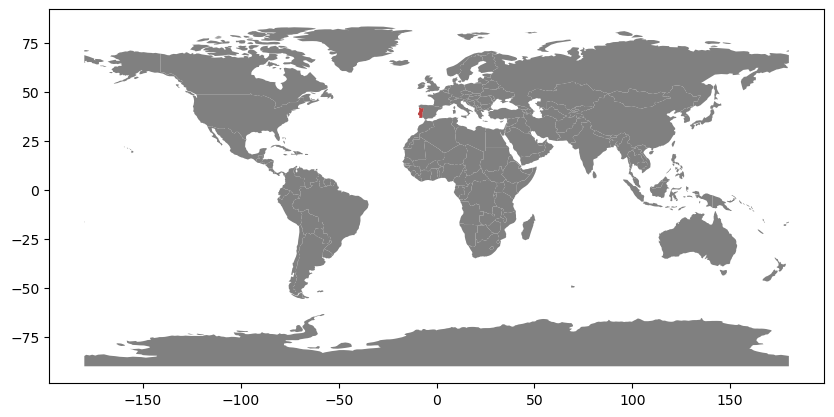

In [29]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Polygon

# Load world map data
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Choose a country to highlight
country_name = 'Portugal'

# Get the polygon representing the chosen country
country_poly = world.loc[world['name'] == country_name, 'geometry'].iloc[0]

# Create a new GeoDataFrame with the chosen country's polygon
highlight = gpd.GeoDataFrame({'geometry': [country_poly]})

# Plot the world map and highlight the chosen country
fig, ax = plt.subplots(figsize=(10, 6))
world.plot(ax=ax, color='gray')
highlight.plot(ax=ax, color='red', alpha=0.5)

# Show the plot
plt.show()
